In [1]:
import sys,  time
import ipywidgets as widget
from IPython.display import display
import numpy as np
import cv2
from PIL import Image 
from io import BytesIO
cv2.startWindowThread()

0

In [2]:
# !wget https://github.com/AKSHAYUBHAT/TensorFace/raw/master/openface/models/dlib/shape_predictor_68_face_landmarks.dat

In [5]:
!conda install -y cmake
!pip install dlib

/usr/bin/zsh: /data/envs/dsclass/lib/python3.10/site-packages/cv2/../../../../lib/libtinfo.so.6: no version information available (required by /usr/bin/zsh)
Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.10.1
  latest version: 22.9.0

Please update conda by running

    $ conda update -n base -c defaults conda



## Package Plan ##

  environment location: /home/tjw/anaconda3/envs/dsclass

  added / updated specs:
    - cmake


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    cmake-3.22.1               |       h1fce559_0         7.3 MB
    rhash-1.4.1                |       h3c74f83_1         203 KB
    ------------------------------------------------------------
                                           Total:         7.5 MB

The following NEW packages will be INSTALLED:

  c-ares             pkgs/main/linux-64::c-ares-1.18.1-h7f8727e_

In [3]:
import dlib
sd = dlib.shape_predictor("shape_predictor_68_face_landmarks.dat")
fr = cv2.face.createEigenFaceRecognizer()
fd = dlib.get_frontal_face_detector()

ModuleNotFoundError: No module named 'dlib'

使用攝影機

In [6]:
cap = cv2.VideoCapture(0)
cap.set(3,1920)
cap.set(4,1080)
while True:
    ret, img0 = cap.read()
    img = cv2.resize(img0, (640,360))
    H, W = img.shape[:2]    
    keycode = cv2.waitKey(1) & 0xff
    if  keycode == ord('q'):
        break
    rl = fd(img)
    for r in rl:
        shape = sd(img, r)
        poly = np.int32([(x.x, x.y) for x in shape.parts()])*2
        img0 = cv2.polylines(img0, np.int32([poly[:17]]) , 0, (0,255,255))
        img0 = cv2.polylines(img0, np.int32([poly[17:22]]) , 0, (255,0,255))
        img0 = cv2.polylines(img0, np.int32([poly[22:27]]) , 0, (255,0,255))
        img0 = cv2.polylines(img0, np.int32([poly[27:31]]) , 0, (0,255,0))
        img0 = cv2.polylines(img0, np.int32([poly[30:36]]) , 1, (0,255,0))
        img0 = cv2.polylines(img0, np.int32([poly[36:42]]) , 1, (255,255,255))
        img0 = cv2.polylines(img0, np.int32([poly[42:48]]) , 1, (255,255,255))
        img0 = cv2.polylines(img0, np.int32([poly[48:60]]) , 1, (255,255,0))
        img0 = cv2.polylines(img0, np.int32([poly[60:68]]) , 1, (255,255,0))
        #img = cv2.rectangle(img, (r.left(),r.top()), (r.right(),r.bottom()),  (255,255,0))
    
    img0 = cv2.flip(img0, 1)
    cv2.imshow('frame', img0)
cv2.destroyWindow('frame')
cap.release()

使用圖片

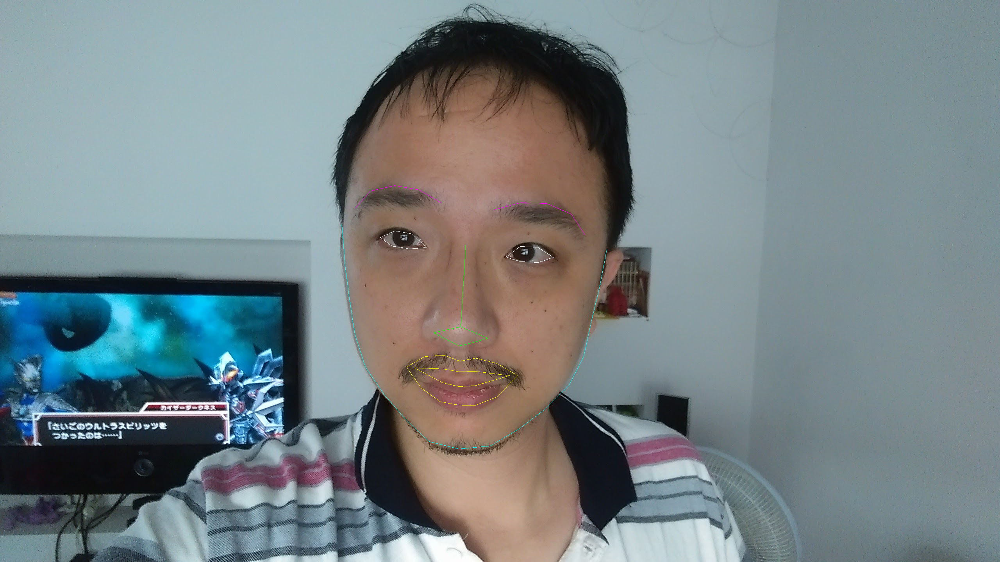

In [50]:
img = np.array(Image.open('img/tjw1.jpg'))
H, W = img.shape[:2]    
rl = fd(img)
for r in rl:
    shape = sd(img, r)
    poly = np.float32([(x.x, x.y) for x in shape.parts()])
    img = cv2.polylines(img, np.int32([poly[:17]]) , 0, (0,255,255))
    img = cv2.polylines(img, np.int32([poly[17:22]]) , 0, (255,0,255))
    img = cv2.polylines(img, np.int32([poly[22:27]]) , 0, (255,0,255))
    img = cv2.polylines(img, np.int32([poly[27:31]]) , 0, (0,255,0))
    img = cv2.polylines(img, np.int32([poly[30:36]]) , 1, (0,255,0))
    img = cv2.polylines(img, np.int32([poly[36:42]]) , 1, (255,255,255))
    img = cv2.polylines(img, np.int32([poly[42:48]]) , 1, (255,255,255))
    img = cv2.polylines(img, np.int32([poly[48:60]]) , 1, (255,255,0))
    img = cv2.polylines(img, np.int32([poly[60:68]]) , 1, (255,255,0))
    #img = cv2.rectangle(img, (r.left(),r.top()), (r.right(),r.bottom()),  (255,255,0))

Image.fromarray(img)

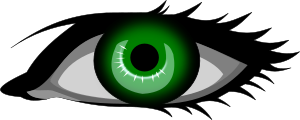

In [5]:
# eye image from openclipart
img_eye = np.array(Image.open('img/secretlondon-Green-eye-300px.png'))
Image.fromarray(img_eye)

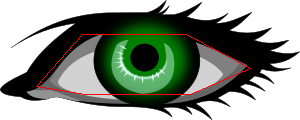

In [44]:
# 手動加上 shape
eye_shape = np.float32(
      [[   36. ,  86. ],
       [  82.8,   34. ],
       [ 186.3,   34. ],
       [ 250.3,   68. ],
       [ 190.9,  94. ],
       [  85.1,  94. ]])
img_eye = np.array(Image.open('img/secretlondon-Green-eye-300px.png'))
img2 = cv2.polylines(img_eye, np.int32([eye_shape]) , 1, (255,0,0,255))
Image.fromarray(img2)

取得轉換矩陣

In [45]:
M = cv2.getPerspectiveTransform(eye_shape[[0,1,3,4]], poly[[42,43,45,46]])
M

array([[  1.08266219e-01,  -1.69853210e+00,   1.29840692e+03],
       [ -1.31577293e-01,  -2.13223164e-01,   6.10564190e+02],
       [ -2.73837822e-04,  -1.13139030e-03,   1.00000000e+00]])

轉換

In [46]:
paste = cv2.warpPerspective(img_eye, M, img.shape[1::-1])

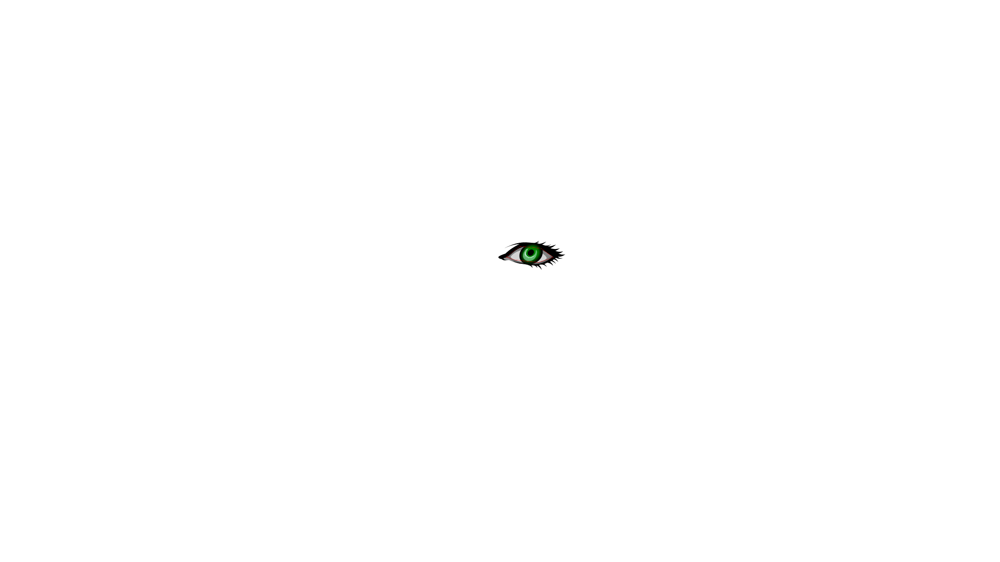

In [47]:
paste = Image.fromarray(paste)
paste

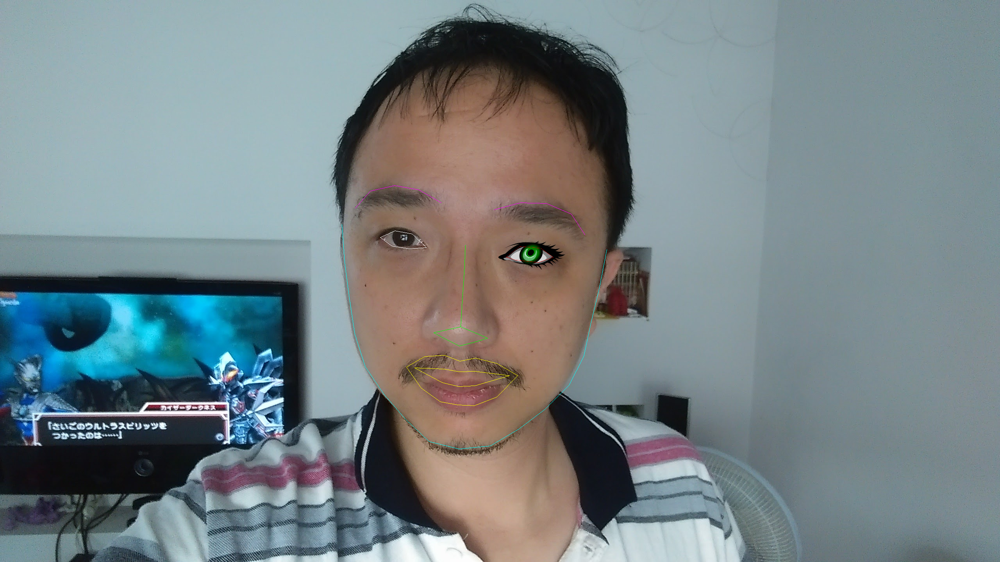

In [48]:
result = Image.fromarray(img)
result.paste(paste,(0, 0), paste)
result

兩眼

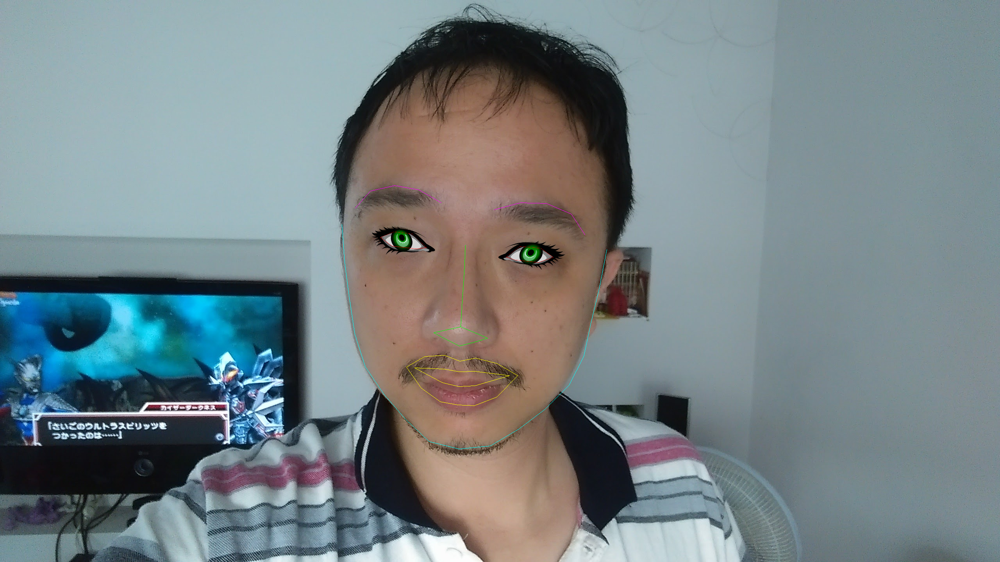

In [49]:
M = cv2.getPerspectiveTransform(eye_shape[[0,1,3,4]], np.float32(poly[[39,38,36,41]]))
paste = cv2.warpPerspective(img_eye, M, img.shape[1::-1])
paste = Image.fromarray(paste)
result.paste(paste, (0,0), paste)
result

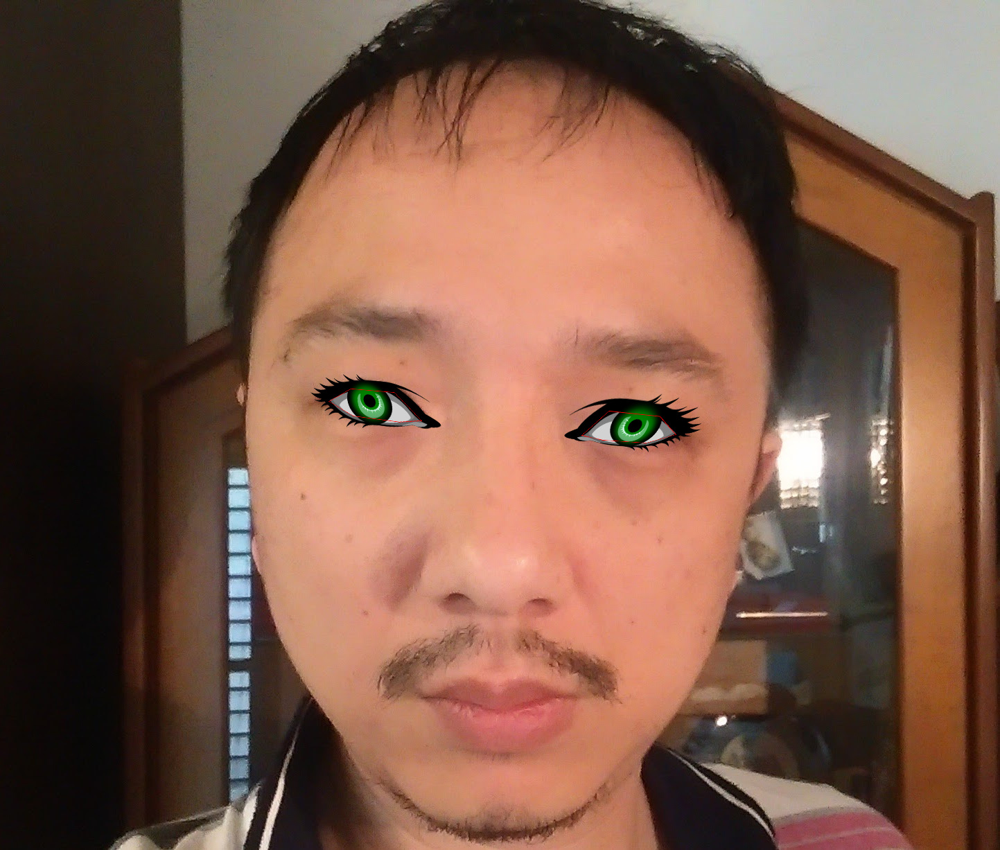

In [71]:
result = img = Image.open("img/tjw2.jpg")
img = np.array(img)
result = Image.fromarray(img)
rl = fd(img)
for r in rl:
    shape = sd(img, r)
    poly = np.float32([(x.x, x.y) for x in shape.parts()])
    # left eye
    M = cv2.getPerspectiveTransform(eye_shape[[0,1,3,4]], np.float32(poly[[42,43,45,46]]))
    paste = cv2.warpPerspective(img_eye, M, img.shape[1::-1])
    paste = Image.fromarray(paste)
    result.paste(paste, (0,0), paste)
    # right eye
    M = cv2.getPerspectiveTransform(eye_shape[[0,1,3,4]], np.float32(poly[[39,38,36,41]]))
    paste = cv2.warpPerspective(img_eye, M, img.shape[1::-1])
    paste = Image.fromarray(paste)
    result.paste(paste, (0,0), paste)
result